In [1]:
import warnings
warnings.simplefilter("ignore")
import pypsa
import time
import logging
import numpy as np
import os 
import sys
import yaml
import pyomo.environ as pyomo_env
import pandas as pd
from scipy.spatial import ConvexHull,  Delaunay
from scipy.interpolate import griddata
from multiprocessing import Lock, Process, Queue, current_process
import queue # imported for using queue.Empty exception
sys.path.append(os.getcwd())
import plotly.graph_objects as go
import plotly.figure_factory as ff
warnings.simplefilter("ignore")

In [2]:

network = pypsa.Network()
network.import_from_hdf5('PyPSA_project/data/networks/euro_00')
dim = 3

bus_list = ['DK','SE','NO','DE','PL','CZ','NL','AT','CH']

bus_list = bus_list[:dim]

for bus in network.buses.index:
    if bus not in bus_list:
        network.remove('Bus',name=bus)
        network.remove('Load',bus)

for link in network.links.index:
    if not (network.links.loc[link].bus0 in bus_list and network.links.loc[link].bus1 in bus_list ):
        network.remove('Link',link)

for generator in network.generators.index:
    if not network.generators.loc[generator].bus in bus_list:
        network.remove('Generator',generator)

for generator in network.generators.index:
    if network.generators.loc[generator].type == 'solar':
        network.remove('Generator',generator)        
"""
for generator in network.generators.index:
    if network.generators.loc[generator].type == 'solar':
        #network.remove('Generator',generator)
        network.generators['type'][generator] = 'wind'
"""
network.snapshots = network.snapshots[384:394]

INFO:pypsa.io:Imported network euro_00 has buses, carriers, generators, global_constraints, links, loads


In [3]:
network.remove('Generator','DK onwind')
#network.remove('Generator','DK ocgt')
network.remove('Generator','SE offwind')
#network.remove('Generator','NO offwind')
network.remove('Generator','NO offwind')
#network.remove('Generator','NO onwind')

In [4]:
network.generators

,bus,control,type,p_nom_extendable,p_nom_max,carrier,marginal_cost,capital_cost,efficiency,min_up_time,...,p_set,q_set,sign,committable,start_up_cost,shut_down_cost,ramp_limit_up,ramp_limit_down,ramp_limit_start_up,ramp_limit_shut_down
name,,,,,,,,,,,,,,,,,,,,,
DK offwind,DK,PQ,wind,True,1.013904e+05,offwind,0.020000,295041.156155,1.00,0,...,0.0,0.0,1.0,False,0.0,0.0,NaN,NaN,1.0,1.0
DK ocgt,DK,PQ,ocgt,True,inf,ocgt,58.384615,47234.561404,0.39,0,...,0.0,0.0,1.0,False,0.0,0.0,NaN,NaN,1.0,1.0
NO onwind,NO,Slack,wind,True,1.707278e+05,onwind,0.015000,136428.031355,1.00,0,...,0.0,0.0,1.0,False,0.0,0.0,NaN,NaN,1.0,1.0
NO ocgt,NO,PQ,ocgt,True,inf,ocgt,58.384615,47234.561404,0.39,0,...,0.0,0.0,1.0,False,0.0,0.0,NaN,NaN,1.0,1.0
SE onwind,SE,Slack,wind,True,3.024149e+05,onwind,0.015000,136428.031355,1.00,0,...,0.0,0.0,1.0,False,0.0,0.0,NaN,NaN,1.0,1.0
SE ocgt,SE,PQ,ocgt,True,inf,ocgt,58.384615,47234.561404,0.39,0,...,0.0,0.0,1.0,False,0.0,0.0,NaN,NaN,1.0,1.0


### Initial solution

In [5]:

network.lopf(network.snapshots, 
            solver_name='gurobi'),

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is NO
INFO:pypsa.pf:Slack bus for sub-network 2 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi
INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x130
  Lower bound: 2176051978.733021
  Upper bound: 2176051978.733021
  Number of objectives: 1
  Number of constraints: 242
  Number of variables: 130
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 130
  Number of nonzeros: 481
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model wa

(('ok', 'optimal'),)

(<matplotlib.collections.PathCollection at 0x1bcb5f693c8>,
 <matplotlib.collections.LineCollection at 0x1bcb7254e80>)

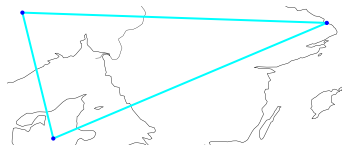

In [6]:
network.plot()

In [7]:
co2_emission = [constraint.body() for constraint in network.model.global_constraints.values()][0]
co2_emission
network.remove('GlobalConstraint',"co2_limit")
target = (1-0.60)*co2_emission
network.add("GlobalConstraint","co2_limit",
      sense="<=",
      carrier_attribute="co2_emissions",
      constant=target)


In [8]:
network.lopf(network.snapshots, 
            solver_name='gurobi')
old_objective_value = network.model.objective()

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is NO
INFO:pypsa.pf:Slack bus for sub-network 2 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi
INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x130
  Lower bound: 7737045864.467227
  Upper bound: 7737045864.467227
  Number of objectives: 1
  Number of constraints: 242
  Number of variables: 130
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 130
  Number of nonzeros: 481
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model wa

In [9]:
network.generators.p_nom_opt
inital_solution = []
"""
for var_type in ['ocgt','wind','solar']:
    filter1 = network.generators.type==var_type
    inital_solution.append(sum(network.generators.p_nom_opt[filter1]))
    """
inital_solution = network.generators.p_nom_opt
inital_solution

name
DK offwind        0.000000
DK ocgt        5454.000000
NO onwind     28733.375177
NO ocgt        6302.999857
SE onwind     19711.677176
SE ocgt       11853.958250
Name: p_nom_opt, dtype: float64

### Function definitions

In [10]:
def direction_search(network, snapshots,options,direction): #  MGA_slack = 0.05, point=[0,0,0],dim=3,old_objective_value=0):
# Identify the nonzero decision variables that should enter the MGA objective function.
    old_objective_value = options['old_objective_value']
    dim = options['dim']
    MGA_slack = 0.1

    if dim == 3:
        generators = [gen_p for gen_p in network.model.generator_p_nom]
        variables = []

        gen_p_type = [gen_p  for gen_p in generators if gen_p[-4:]=='ocgt']
        variables.append(sum([network.model.generator_p_nom[gen_p] for gen_p in gen_p_type]))
        
        gen_p_type = [gen_p  for gen_p in generators if gen_p[-4:]=='wind' or gen_p[-4:]=='olar']
        variables.append(sum([network.model.generator_p_nom[gen_p] for gen_p in gen_p_type]))
            
                             
    elif dim == 2:
        generators = [gen_p for gen_p in network.model.generator_p_nom]
        types = ['ocgt','wind','olar']
        variables = []
        for i in range(3):
            gen_p_type = [gen_p  for gen_p in generators if gen_p[-4:]==types[i]]
            variables.append(sum([network.model.generator_p_nom[gen_p] for gen_p in gen_p_type]))
        slack = 0    
        point = options['point']
        #point = inital_solution
        print(variables[0]== point[0])
        network.model.ocgt_constraint_u = pyomo_env.Constraint(expr=variables[0]== point[0])
        #network.model.ocgt_constraint_l = pyomo_env.Constraint(expr=variables[0]>= inital_solution[0]+1000-slack)
        network.model.wind_constraint_u = pyomo_env.Constraint(expr=variables[1]== point[1])
        #network.model.wind_constraint_l = pyomo_env.Constraint(expr=variables[1]>= inital_solution[1]+1000-slack)
        #network.model.solar_constraint_u = pyomo_env.Constraint(expr=variables[2]== point[2])
        #network.model.solar_constraint_l = pyomo_env.Constraint(expr=variables[2]>= inital_solution[2]+1000-slack)
        """                                                     
        variables = []
        for bus in network.buses.index:
            var = []
            for generator in network.model.generator_p_nom:
                if network.generators.loc[generator].type == 'wind' and network.generators.loc[generator].bus == bus :
                    var.append(network.model.generator_p_nom[generator])
            variables.append(sum(var))
            print(sum(var))    """       
        variables = [network.model.generator_p_nom[gen_p] for gen_p in network.model.generator_p_nom]
                             
    else :
        variables = [network.model.generator_p_nom[gen_p] for gen_p in network.model.generator_p_nom]
        
    objective = 0
    for i in range(len(variables)):
        #print(variables[i])
        objective += direction[i]*variables[i]

    print(objective)
    # Add the new MGA objective function to the model.
    #objective += network.model.objective.expr * 1e-9
    network.model.mga_objective = pyomo_env.Objective(expr=objective)
    # Deactivate the old objective function and activate the MGA objective function.
    network.model.objective.deactivate()
    network.model.mga_objective.activate()
    # Add the MGA slack constraint.
    network.model.mga_constraint = pyomo_env.Constraint(expr=network.model.objective.expr <= 
                                          (1 + MGA_slack) * old_objective_value)


In [11]:
def rand_split(n):
    
    rand_list = np.random.random(n-1)
    rand_list.sort()
    rand_list = np.concatenate([[0],rand_list,[1]])
    rand_list = np.diff(rand_list)

    return rand_list

def create_interior_points(hull,m):
    #m = 20

    # Generate Delunay triangulation of hull
    try :
        tri = Delaunay(hull.points[hull.vertices])#,qhull_options='Qs')#,qhull_options='A-0.999')
    except : 
        points = np.append(hull.points[hull.vertices],[np.mean(hull.points,axis=0)],axis=0)            
        tri = Delaunay(points,qhull_options='Qs')
    # Distribute number of points based on simplex size 
    tri.volumes = []
    for i in range(len(tri.simplices)):
        try :
            tri.volumes.append(ConvexHull(tri.points[tri.simplices[i,:]]).volume)
        except : 
            tri.volumes.append(0)
    tri.volumes = np.array(tri.volumes)
    tri.volumes_norm = tri.volumes/sum(tri.volumes)

    tri.n_points_in_tri =  (tri.volumes_norm*m).astype(int)
    # Generate interrior points of each simplex
    interrior_points = []
    for i in range(len(tri.simplices)):
        tri_face = tri.points[tri.simplices[i,:]]
        for j in range(tri.n_points_in_tri[i]):
            dim = len(tri.points[0,:])
            rand_list = rand_split(dim+1)

            new_point = sum([face*rand_n for face,rand_n in zip(tri_face,rand_list)])
            interrior_points.append(new_point)
    interrior_points = np.array(interrior_points)
    return interrior_points

### MGA with $\sum$ variables

In [12]:
#logging.disable()
data_detail_sum = []
options = dict(dim=3,old_objective_value=old_objective_value)
dim=2
old_volume = 0
epsilon = 1
while epsilon > 0.01:
    data_detail = list(data_detail_sum)
    if len(data_detail_sum)<=1 : # if only original solution exists, max/min directions are chosen
        directions = np.concatenate([np.diag(np.ones(dim)),-np.diag(np.ones(dim))],axis=0)
    else : # Otherwise search in directions normal to faces
        directions = np.array(hull.equations)[:,0:-1]
    # Itterate over directions in batch 
    for direction in directions:
        print(direction)
        direction = np.concatenate([direction,[0]])
        network.lopf(network.snapshots,                                 
                        solver_name='gurobi',                                 
                        extra_functionality=lambda network,                                 
                        snapshots: direction_search(network,snapshots,options,direction))

        var = []
        for var_type in ['ocgt','wind']:#,'solar']:
            filter1 = network.generators.type==var_type
            var.append(sum(network.generators.p_nom_opt[filter1]))
        data_detail_sum.append(var)
    

    hull = ConvexHull(data_detail_sum)#,qhull_options='QJ')
    
    delta_v = hull.volume - old_volume
    old_volume = hull.volume
    epsilon = delta_v/hull.volume
    
    print(epsilon)


data_detail_sum = np.array(data_detail_sum)

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is NO
INFO:pypsa.pf:Slack bus for sub-network 2 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation


[1. 0.]


INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x130
  Lower bound: 20481.132184566835
  Upper bound: 20481.132184566835
  Number of objectives: 1
  Number of constraints: 243
  Number of variables: 130
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 130
  Number of nonzeros: 550
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model 

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is NO
INFO:pypsa.pf:Slack bus for sub-network 2 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


generator_p_nom[DK offwind] + generator_p_nom[NO onwind] + generator_p_nom[SE onwind]


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x130
  Lower bound: 43929.10960346019
  Upper bound: 43929.10960346019
  Number of objectives: 1
  Number of constraints: 243
  Number of variables: 130
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 130
  Number of nonzeros: 550
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model wa

INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is NO
INFO:pypsa.pf:Slack bus for sub-network 2 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation
INFO:pypsa.opf:Solving model using gurobi


- (generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt])


INFO:pypsa.opf:Optimization successful
INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is NO
INFO:pypsa.pf:Slack bus for sub-network 2 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x130
  Lower bound: -40047.805845764
  Upper bound: -40047.805845764
  Number of objectives: 1
  Number of constraints: 243
  Number of variables: 130
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 130
  Number of nonzeros: 550
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model was 

INFO:pypsa.opf:Solving model using gurobi


- (generator_p_nom[DK offwind] + generator_p_nom[NO onwind] + generator_p_nom[SE onwind])


INFO:pypsa.opf:Optimization successful
INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is NO
INFO:pypsa.pf:Slack bus for sub-network 2 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x130
  Lower bound: -55228.11219566745
  Upper bound: -55228.11219566745
  Number of objectives: 1
  Number of constraints: 243
  Number of variables: 130
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 130
  Number of nonzeros: 550
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model 

INFO:pypsa.opf:Solving model using gurobi


-0.9488102727275322*(generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]) - 0.31584658675804295*(generator_p_nom[DK offwind] + generator_p_nom[NO onwind] + generator_p_nom[SE onwind])


INFO:pypsa.opf:Optimization successful
INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is NO
INFO:pypsa.pf:Slack bus for sub-network 2 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x130
  Lower bound: -53300.731487805475
  Upper bound: -53300.731487805475
  Number of objectives: 1
  Number of constraints: 243
  Number of variables: 130
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 130
  Number of nonzeros: 550
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Mode

INFO:pypsa.opf:Solving model using gurobi


0.27447010243918296*(generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]) - 0.9615956337603788*(generator_p_nom[DK offwind] + generator_p_nom[NO onwind] + generator_p_nom[SE onwind])


INFO:pypsa.opf:Optimization successful
INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is NO
INFO:pypsa.pf:Slack bus for sub-network 2 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x130
  Lower bound: -47479.70355744808
  Upper bound: -47479.70355744808
  Number of objectives: 1
  Number of constraints: 243
  Number of variables: 130
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 130
  Number of nonzeros: 550
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model 

INFO:pypsa.opf:Solving model using gurobi


-0.9800117390616693*(generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]) + 0.19893966749073105*(generator_p_nom[DK offwind] + generator_p_nom[NO onwind] + generator_p_nom[SE onwind])


INFO:pypsa.opf:Optimization successful
INFO:pypsa.pf:Slack bus for sub-network 0 is DK
INFO:pypsa.pf:Slack bus for sub-network 1 is NO
INFO:pypsa.pf:Slack bus for sub-network 2 is SE
INFO:pypsa.opf:Performed preliminary steps
INFO:pypsa.opf:Building pyomo model using `angles` formulation


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x130
  Lower bound: -29608.57028270934
  Upper bound: -29608.57028270934
  Number of objectives: 1
  Number of constraints: 243
  Number of variables: 130
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 130
  Number of nonzeros: 550
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model 

INFO:pypsa.opf:Solving model using gurobi


0.32762505575928536*(generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]) + 0.9448078232311189*(generator_p_nom[DK offwind] + generator_p_nom[NO onwind] + generator_p_nom[SE onwind])


INFO:pypsa.opf:Optimization successful


# ==========================================================
# = Solver Results                                         =
# ==========================================================
# ----------------------------------------------------------
#   Problem Information
# ----------------------------------------------------------
Problem: 
- Name: x130
  Lower bound: 49435.34574160892
  Upper bound: 49435.34574160892
  Number of objectives: 1
  Number of constraints: 243
  Number of variables: 130
  Number of binary variables: 0
  Number of integer variables: 0
  Number of continuous variables: 130
  Number of nonzeros: 550
  Sense: minimize
# ----------------------------------------------------------
#   Solver Information
# ----------------------------------------------------------
Solver: 
- Status: ok
  Return code: 0
  Message: Model was solved to optimality (subject to tolerances), and an optimal solution is available.
  Termination condition: optimal
  Termination message: Model wa

In [13]:
hull_sum = ConvexHull(data_detail_sum)
interior_points_sum = create_interior_points(hull_sum,1000)

In [14]:
fig = go.Figure()



fig.add_trace(go.Scatter(x=hull_sum.points[np.append(hull_sum.vertices,hull_sum.vertices[0])][:,1],
                          y=hull_sum.points[np.append(hull_sum.vertices,hull_sum.vertices[0])][:,0],
                          #z=data_detail_sum[:,2],
                          mode='lines'))

fig.add_trace(go.Scatter(x=data_detail_sum[:,1],
                          y=data_detail_sum[:,0],
                          #z=data_detail_sum[:,2],
                          mode='markers',name='MGA solutions'))

fig.add_trace(go.Scatter(y=[inital_solution[1]+inital_solution[3]+inital_solution[5]],
                          x=[inital_solution[0]+inital_solution[2]+inital_solution[4]],
                          #z=[np.mean(data_detail_sum,axis=0)[2]],
                          mode='markers',name='Initial_solution'))

fig.add_trace(go.Scatter(x=interior_points_sum[:,1],
                          y=interior_points_sum[:,0],
                          #z=[np.mean(data_detail_sum,axis=0)[2]],
                          mode='markers',name='Interrior_points'))
fig.update_yaxes(title_text='$x_2+x_4$')
fig.update_xaxes(title_text='$x_1+x_3$')


In [39]:
import matplotlib.pyplot as plt
import matplotlib
import scipy.stats as stats
matplotlib.rcParams.update({'font.size': 18})
def plot_hist(ax,x,w=[] ,color='C1'):
    if len(w)<=0 :
        w = np.ones(len(x))
    kde1 = stats.gaussian_kde(x*1e-3,weights=w)
    xx = np.linspace(20, 60, 1000)
    ax.hist(x=x*1e-3,stacked=False,weights=w,bins=20,density=True,histtype='stepfilled', alpha=0.5,color=color);
    ax.plot(xx, kde1(xx),color=color)
    return ax

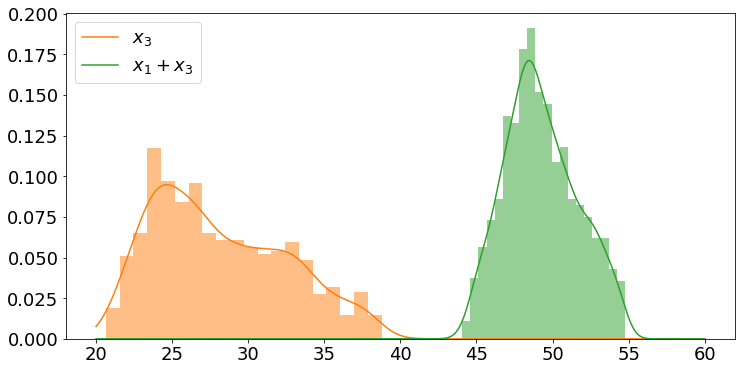

In [40]:
fig, ax = plt.subplots(figsize=(12,6))
ax = plot_hist(ax,interior_points_sum[:,0],color='C1')
ax = plot_hist(ax,interior_points_sum[:,1],color='C2')
ax.legend(['$x_3$','$x_1+x_3$']);


### Multiplicity MGA

In [41]:
#sample_points = create_interior_points(hull_sum,10)
#sample_points = np.concatenate([data_detail_sum,sample_points])

sample_points = np.concatenate([data_detail_sum,interior_points_sum[np.random.rand(len(interior_points_sum))>0.3]])

In [42]:
weights = []
for point in sample_points : 
    data_detail = []
    dim = 4
    old_volume = 0
    epsilon = 1
    while epsilon > 0.05:

        test = np.array([[1,1,-1,-1,0,0],[1,1,0,0,-1,-1],[1,1,0,-1,-1,0],[1,1,-1,0,0,-1]])
        directions = np.concatenate([test,-test],axis=0)

        for direction in directions:
            #print(direction)
            network = network.copy()
            #options = dict(dim=2,old_objective_value=old_objective_value,point=data_detail_sum[1,:])
            options = dict(dim=2,old_objective_value=old_objective_value,point=point)
            network.lopf(network.snapshots,                                 
                            solver_name='gurobi',                                 
                            extra_functionality=lambda network,                                 
                            snapshots: direction_search(network,snapshots,options,direction),
                            solver_options=dict(threads=4,method=2))

            var = []
            for country in bus_list:
                filter1 = network.generators.bus==country
                filter2 = network.generators.type=='wind'
                filter = [a and b for a,b in zip(filter1,filter2)]
                var.append(sum(network.generators.p_nom_opt[filter]))
            data_detail.append(network.generators.p_nom_opt.values)
        #hull = ConvexHull(data_detail)#,qhull_options='QJ')

        #delta_v = hull.volume - old_volume
        #old_volume = hull.volume
        #epsilon = delta_v/hull.volume
        epsilon = 0
        print(epsilon)


    data_detail = np.array(data_detail)

    lens = [] 

    for i in range(4):
        direction = directions[i]
        vector = data_detail[i]-data_detail[i+4]
        lens.append(abs(np.dot(vector, direction) / np.linalg.norm(direction)))


    weight = np.prod(lens)
    weights.append(weight)

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  20481.132184566835
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  20481.132184566835
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  20481.132184566835
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  20481.132184566835
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  20481.132184566835
- generator_p_nom[DK offwind] - generator

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  40047.80584576397
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  20502.808651011423
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  20502.808651011423
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  20502.808651011423
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  20502.808651011423
generator_p_nom[DK offwind] + generato

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26228.92255733972
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26228.92255733972
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  38194.15873265562
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  38194.15873265562
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  38194.15873265562
generator_p_nom[DK offwind] + generator_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29084.494940078024
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29084.494940078024
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29084.494940078024
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26304.09998765919
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26304.09998765919
generator_p_nom[DK offwind] + gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23093.12519913733
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23093.12519913733
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23093.12519913733
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23093.12519913733
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32815.15969240371
generator_p_nom[DK offwind] + genera

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37617.54190914356
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37617.54190914356
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37617.54190914356
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37617.54190914356
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37617.54190914356
- generator_p_nom[DK offwind] - generato

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22205.534756650806
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22205.534756650806
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22205.534756650806
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22205.534756650806
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22205.534756650806
- generator_p_nom[DK offwind] - gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31299.566551872307
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31299.566551872307
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31299.566551872307
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31299.566551872307
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31299.566551872307
- generator_p_nom[DK offwind] - generat

0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29111.3419165368
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29111.3419165368
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29111.3419165368
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29111.3419165368
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29111.3419165368
- generator_p_nom[DK offwind] - generator_p_nom[D

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23728.757271901606
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34622.685553620366
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34622.685553620366
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34622.685553620366
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34622.685553620366
generator_p_nom[DK offwind] + generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26216.019962665116
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26216.019962665116
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24267.295663393692
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24267.295663393692
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24267.295663393692
generator_p_nom[DK offwind] + gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32163.76407386341
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32163.76407386341
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32163.76407386341
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26361.403665169717
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26361.403665169717
generator_p_nom[DK offwind] + genera

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34726.80958753216
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34726.80958753216
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34726.80958753216
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34726.80958753216
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34773.26698068829
generator_p_nom[DK offwind] + genera

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31297.857058490416
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31297.857058490416
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31297.857058490416
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31297.857058490416
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31297.857058490416
- generator_p_nom[DK offwind] - gen

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28666.79304215753
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28666.79304215753
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28666.79304215753
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28666.79304215753
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28666.79304215753
- generator_p_nom[DK offwind] - generator_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24740.153843107735
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24740.153843107735
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24740.153843107735
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24740.153843107735
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24740.153843107735
- generator_p_nom[DK offwind] - generat

0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  35914.742226557464
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  35914.742226557464
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  35914.742226557464
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  35914.742226557464
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  35914.742226557464
- generator_p_nom[DK offwind] - generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31361.9443847832
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29152.073127697186
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29152.073127697186
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29152.073127697186
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29152.073127697186
generator_p_nom[DK offwind] + generator

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29408.888217281434
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29408.888217281434
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26673.51072201317
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26673.51072201317
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26673.51072201317
generator_p_nom[DK offwind] + generato

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30321.149827531266
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30321.149827531266
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30321.149827531266
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30155.932702773294
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30155.932702773294
generator_p_nom[DK offwind] + gen

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23739.92583553752
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23739.92583553752
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23739.92583553752
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23739.92583553752
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29236.814759395133
generator_p_nom[DK offwind] + gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24956.624166930364
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24956.624166930364
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24956.624166930364
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24956.624166930364
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24956.624166930364
- generator_p_nom[DK offwind] - gen

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23831.215059030717
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23831.215059030717
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23831.215059030717
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23831.215059030717
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23831.215059030717
- generator_p_nom[DK offwind] - gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24773.884962178658
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24773.884962178658
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24773.884962178658
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24773.884962178658
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24773.884962178658
- generator_p_nom[DK offwind] - generat

0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24123.811859195303
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24123.811859195303
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24123.811859195303
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24123.811859195303
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24123.811859195303
- generator_p_nom[DK offwind] - generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23891.68035980078
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32584.29096846269
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32584.29096846269
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32584.29096846269
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32584.29096846269
generator_p_nom[DK offwind] + generator_p_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22677.902344006812
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22677.902344006812
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28170.269397414955
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28170.269397414955
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28170.269397414955
generator_p_nom[DK offwind] + gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28033.619037050415
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28033.619037050415
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28033.619037050415
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23471.71227076336
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23471.71227076336
generator_p_nom[DK offwind] + gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26897.165092977404
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26897.165092977404
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26897.165092977404
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26897.165092977404
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37156.19959923856
generator_p_nom[DK offwind] + ge

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31344.848286687313
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31344.848286687313
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31344.848286687313
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31344.848286687313
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31344.848286687313
- generator_p_nom[DK offwind] - gen

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24320.95164563204
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24320.95164563204
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24320.95164563204
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24320.95164563204
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24320.95164563204
- generator_p_nom[DK offwind] - generator_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27409.953252263884
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27409.953252263884
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27409.953252263884
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27409.953252263884
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27409.953252263884
- generator_p_nom[DK offwind] - generat

0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30017.553434171434
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30017.553434171434
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30017.553434171434
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30017.553434171434
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30017.553434171434
- generator_p_nom[DK offwind] - generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26836.511390748852
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28273.824918673436
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28273.824918673436
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28273.824918673436
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28273.824918673436
generator_p_nom[DK offwind] + generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30335.264336672113
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30335.264336672113
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26750.768765398654
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26750.768765398654
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26750.768765398654
generator_p_nom[DK offwind] + gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28755.2528396669
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28755.2528396669
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28755.2528396669
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  21624.118414726618
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  21624.118414726618
generator_p_nom[DK offwind] + generator

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24978.541906509265
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24978.541906509265
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24978.541906509265
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24978.541906509265
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24060.36247037982
generator_p_nom[DK offwind] + ge

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25613.677383563656
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25613.677383563656
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25613.677383563656
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25613.677383563656
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25613.677383563656
- generator_p_nom[DK offwind] - gen

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37428.595247873185
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37428.595247873185
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37428.595247873185
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37428.595247873185
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37428.595247873185
- generator_p_nom[DK offwind] - gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23922.050872866508
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23922.050872866508
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23922.050872866508
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23922.050872866508
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23922.050872866508
- generator_p_nom[DK offwind] - generat

0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34655.02966092579
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34655.02966092579
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34655.02966092579
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34655.02966092579
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34655.02966092579
- generator_p_nom[DK offwind] - generator_p_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29900.40756891664
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25846.774901900015
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25846.774901900015
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25846.774901900015
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25846.774901900015
generator_p_nom[DK offwind] + generato

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27785.4219579653
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27785.4219579653
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30268.881117818662
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30268.881117818662
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30268.881117818662
generator_p_nom[DK offwind] + generator

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22559.635267486483
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22559.635267486483
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22559.635267486483
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33521.1479184711
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33521.1479184711
generator_p_nom[DK offwind] + generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27347.144948090696
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27347.144948090696
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27347.144948090696
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27347.144948090696
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24368.051090009958
generator_p_nom[DK offwind] + g

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24010.580655459307
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24010.580655459307
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24010.580655459307
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24010.580655459307
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24010.580655459307
- generator_p_nom[DK offwind] - gen

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23600.39520479423
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23600.39520479423
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23600.39520479423
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23600.39520479423
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23600.39520479423
- generator_p_nom[DK offwind] - generator_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23030.19957228718
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23030.19957228718
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23030.19957228718
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23030.19957228718
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23030.19957228718
- generator_p_nom[DK offwind] - generator_p_

0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28711.74017640399
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28711.74017640399
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28711.74017640399
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28711.74017640399
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28711.74017640399
- generator_p_nom[DK offwind] - generator_p_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26275.420818587445
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27925.72193016486
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27925.72193016486
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27925.72193016486
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27925.72193016486
generator_p_nom[DK offwind] + generator_p

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24533.830213846748
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24533.830213846748
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23674.788247080072
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23674.788247080072
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23674.788247080072
generator_p_nom[DK offwind] + gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28190.496296801593
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28190.496296801593
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28190.496296801593
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  21781.38870645056
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  21781.38870645056
generator_p_nom[DK offwind] + gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29416.27012710233
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29416.27012710233
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29416.27012710233
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29416.27012710233
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25481.246111730117
generator_p_nom[DK offwind] + gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28955.6476546802
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28955.6476546802
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28955.6476546802
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28955.6476546802
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28955.6476546802
- generator_p_nom[DK offwind] - generator_p_n

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30443.84999378759
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30443.84999378759
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30443.84999378759
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30443.84999378759
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30443.84999378759
- generator_p_nom[DK offwind] - generator_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31579.57603503714
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31579.57603503714
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31579.57603503714
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31579.57603503714
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31579.57603503714
- generator_p_nom[DK offwind] - generator_p_

0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25780.104199861256
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25780.104199861256
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25780.104199861256
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25780.104199861256
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25780.104199861256
- generator_p_nom[DK offwind] - generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26254.017181539624
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22065.32409971085
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22065.32409971085
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22065.32409971085
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22065.32409971085
generator_p_nom[DK offwind] + generator_p

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24456.08486632107
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24456.08486632107
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22925.351313852658
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22925.351313852658
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22925.351313852658
generator_p_nom[DK offwind] + generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31040.86766194601
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31040.86766194601
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31040.86766194601
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23923.71247171351
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23923.71247171351
generator_p_nom[DK offwind] + generato

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33983.349082790584
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33983.349082790584
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33983.349082790584
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33983.349082790584
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24668.24197068289
generator_p_nom[DK offwind] + ge

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27200.861105683663
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27200.861105683663
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27200.861105683663
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27200.861105683663
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27200.861105683663
- generator_p_nom[DK offwind] - gen

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23454.102810662625
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23454.102810662625
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23454.102810662625
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23454.102810662625
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23454.102810662625
- generator_p_nom[DK offwind] - gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27248.707160252674
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27248.707160252674
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27248.707160252674
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27248.707160252674
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27248.707160252674
- generator_p_nom[DK offwind] - generat

0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24555.49649018937
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24555.49649018937
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24555.49649018937
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24555.49649018937
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24555.49649018937
- generator_p_nom[DK offwind] - generator_p_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32438.72374435076
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23870.598480735272
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23870.598480735272
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23870.598480735272
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23870.598480735272
generator_p_nom[DK offwind] + generato

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33090.84773999152
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33090.84773999152
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27550.932493520446
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27550.932493520446
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27550.932493520446
generator_p_nom[DK offwind] + generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  36532.15865956913
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  36532.15865956913
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  36532.15865956913
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25027.989186891144
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25027.989186891144
generator_p_nom[DK offwind] + genera

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30637.028764803737
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30637.028764803737
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30637.028764803737
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30637.028764803737
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25095.144501289116
generator_p_nom[DK offwind] + g

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31297.14697685369
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31297.14697685369
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31297.14697685369
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31297.14697685369
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31297.14697685369
- generator_p_nom[DK offwind] - generato

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37524.79438784675
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37524.79438784675
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37524.79438784675
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37524.79438784675
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37524.79438784675
- generator_p_nom[DK offwind] - generator_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24638.766081570393
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24638.766081570393
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24638.766081570393
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24638.766081570393
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24638.766081570393
- generator_p_nom[DK offwind] - generat

0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33370.32255382291
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33370.32255382291
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33370.32255382291
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33370.32255382291
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33370.32255382291
- generator_p_nom[DK offwind] - generator_p_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26617.400152301736
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26450.456241630705
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26450.456241630705
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26450.456241630705
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26450.456241630705
generator_p_nom[DK offwind] + generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28868.794892531576
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28868.794892531576
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29075.940343587383
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29075.940343587383
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29075.940343587383
generator_p_nom[DK offwind] + gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29597.450979425135
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29597.450979425135
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29597.450979425135
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  35809.38430862605
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  35809.38430862605
generator_p_nom[DK offwind] + gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33059.327392782725
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33059.327392782725
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33059.327392782725
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33059.327392782725
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32639.04331182919
generator_p_nom[DK offwind] + ge

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33909.71165334059
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33909.71165334059
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33909.71165334059
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33909.71165334059
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33909.71165334059
- generator_p_nom[DK offwind] - generato

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23460.870164728352
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23460.870164728352
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23460.870164728352
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23460.870164728352
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23460.870164728352
- generator_p_nom[DK offwind] - gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32812.26928488857
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32812.26928488857
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32812.26928488857
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32812.26928488857
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32812.26928488857
- generator_p_nom[DK offwind] - generator_p_

0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37213.35527071084
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37213.35527071084
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37213.35527071084
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37213.35527071084
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37213.35527071084
- generator_p_nom[DK offwind] - generator_p_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29003.979617504538
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25314.139369566612
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25314.139369566612
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25314.139369566612
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25314.139369566612
generator_p_nom[DK offwind] + generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29170.163918115217
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29170.163918115217
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27782.631230777442
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27782.631230777442
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27782.631230777442
generator_p_nom[DK offwind] + gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22234.95825049541
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22234.95825049541
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22234.95825049541
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25706.57561999319
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25706.57561999319
generator_p_nom[DK offwind] + generato

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23112.865354807254
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23112.865354807254
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23112.865354807254
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23112.865354807254
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29709.51943686786
generator_p_nom[DK offwind] + ge

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25602.38762229431
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25602.38762229431
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25602.38762229431
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25602.38762229431
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25602.38762229431
- generator_p_nom[DK offwind] - generato

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24423.178075927237
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24423.178075927237
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24423.178075927237
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24423.178075927237
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24423.178075927237
- generator_p_nom[DK offwind] - gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33288.61238536311
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33288.61238536311
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33288.61238536311
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33288.61238536311
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33288.61238536311
- generator_p_nom[DK offwind] - generator_p_

0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24157.340635649252
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24157.340635649252
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24157.340635649252
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24157.340635649252
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24157.340635649252
- generator_p_nom[DK offwind] - generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25543.124807217275
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25818.921740052087
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25818.921740052087
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25818.921740052087
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25818.921740052087
generator_p_nom[DK offwind] + generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32115.51810965414
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32115.51810965414
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22483.427171745752
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22483.427171745752
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22483.427171745752
generator_p_nom[DK offwind] + generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24053.02193668777
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24053.02193668777
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24053.02193668777
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31947.368160554135
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31947.368160554135
generator_p_nom[DK offwind] + genera

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34533.60211865289
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34533.60211865289
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34533.60211865289
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34533.60211865289
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  36576.317545851896
generator_p_nom[DK offwind] + gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31750.684522959684
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31750.684522959684
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31750.684522959684
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31750.684522959684
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31750.684522959684
- generator_p_nom[DK offwind] - gen

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32248.280260238134
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32248.280260238134
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32248.280260238134
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32248.280260238134
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32248.280260238134
- generator_p_nom[DK offwind] - gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27515.668188674
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27515.668188674
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27515.668188674
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27515.668188674
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27515.668188674
- generator_p_nom[DK offwind] - generator_p_nom[DK ocg

0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33918.23145222587
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33918.23145222587
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33918.23145222587
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33918.23145222587
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33918.23145222587
- generator_p_nom[DK offwind] - generator_p_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31602.3894053049
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26995.364329434433
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26995.364329434433
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26995.364329434433
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26995.364329434433
generator_p_nom[DK offwind] + generator

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23420.247803405287
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23420.247803405287
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23083.83057981459
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23083.83057981459
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23083.83057981459
generator_p_nom[DK offwind] + generato

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33506.53076839235
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33506.53076839235
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33506.53076839235
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25623.32236221759
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25623.32236221759
generator_p_nom[DK offwind] + generato

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25456.659274678317
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25456.659274678317
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25456.659274678317
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25456.659274678317
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23892.64971575659
generator_p_nom[DK offwind] + ge

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33301.89992309458
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33301.89992309458
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33301.89992309458
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33301.89992309458
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33301.89992309458
- generator_p_nom[DK offwind] - generato

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  35539.843731470675
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  35539.843731470675
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  35539.843731470675
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  35539.843731470675
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  35539.843731470675
- generator_p_nom[DK offwind] - gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24358.502069809838
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24358.502069809838
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24358.502069809838
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24358.502069809838
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24358.502069809838
- generator_p_nom[DK offwind] - generat

0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23884.783581113465
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23884.783581113465
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23884.783581113465
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23884.783581113465
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23884.783581113465
- generator_p_nom[DK offwind] - generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  38576.06988946772
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24557.81274387119
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24557.81274387119
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24557.81274387119
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24557.81274387119
generator_p_nom[DK offwind] + generator_p_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25697.332404876946
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25697.332404876946
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24469.530704101457
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24469.530704101457
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24469.530704101457
generator_p_nom[DK offwind] + gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28058.579953722437
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28058.579953722437
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28058.579953722437
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27405.463353639945
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27405.463353639945
generator_p_nom[DK offwind] + gen

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27033.92993701082
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27033.92993701082
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27033.92993701082
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27033.92993701082
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23114.13460548612
generator_p_nom[DK offwind] + genera

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  21994.0787361842
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  21994.0787361842
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  21994.0787361842
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  21994.0787361842
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  21994.0787361842
- generator_p_nom[DK offwind] - generator_p_n

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25434.490511252974
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25434.490511252974
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25434.490511252974
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25434.490511252974
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25434.490511252974
- generator_p_nom[DK offwind] - gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37698.158856550544
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37698.158856550544
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37698.158856550544
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37698.158856550544
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37698.158856550544
- generator_p_nom[DK offwind] - generat

0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23536.038237304645
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23536.038237304645
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23536.038237304645
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23536.038237304645
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23536.038237304645
- generator_p_nom[DK offwind] - generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  38065.48143076109
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23941.18933962036
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23941.18933962036
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23941.18933962036
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23941.18933962036
generator_p_nom[DK offwind] + generator_p_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23775.657064749095
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23775.657064749095
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33885.29859442315
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33885.29859442315
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33885.29859442315
generator_p_nom[DK offwind] + generato

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24959.148702490136
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24959.148702490136
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24959.148702490136
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22632.666610504144
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22632.666610504144
generator_p_nom[DK offwind] + gen

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34225.67384999711
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34225.67384999711
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34225.67384999711
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34225.67384999711
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32678.91597190578
generator_p_nom[DK offwind] + genera

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22026.5833650012
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22026.5833650012
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22026.5833650012
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22026.5833650012
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22026.5833650012
- generator_p_nom[DK offwind] - generator_p_n

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25523.720550310216
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25523.720550310216
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25523.720550310216
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25523.720550310216
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25523.720550310216
- generator_p_nom[DK offwind] - gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27754.950655609784
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27754.950655609784
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27754.950655609784
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27754.950655609784
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27754.950655609784
- generator_p_nom[DK offwind] - generat

0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  21775.239524241922
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  21775.239524241922
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  21775.239524241922
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  21775.239524241922
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  21775.239524241922
- generator_p_nom[DK offwind] - generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22293.796136303212
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22355.016973330996
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22355.016973330996
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22355.016973330996
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  22355.016973330996
generator_p_nom[DK offwind] + generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25474.918283683073
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25474.918283683073
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26417.20577248595
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26417.20577248595
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26417.20577248595
generator_p_nom[DK offwind] + generato

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  20797.063838744692
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  20797.063838744692
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  20797.063838744692
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37765.80506884167
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37765.80506884167
generator_p_nom[DK offwind] + gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32968.4680892447
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32968.4680892447
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32968.4680892447
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32968.4680892447
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25985.89515761834
generator_p_nom[DK offwind] + generator_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33171.01206162447
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33171.01206162447
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33171.01206162447
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33171.01206162447
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  33171.01206162447
- generator_p_nom[DK offwind] - generato

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30883.901551582476
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30883.901551582476
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30883.901551582476
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30883.901551582476
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30883.901551582476
- generator_p_nom[DK offwind] - gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29367.304620622224
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29367.304620622224
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29367.304620622224
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29367.304620622224
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  29367.304620622224
- generator_p_nom[DK offwind] - generat

0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26524.082890942846
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26524.082890942846
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26524.082890942846
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26524.082890942846
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26524.082890942846
- generator_p_nom[DK offwind] - generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  21517.538564982427
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24779.590797197285
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24779.590797197285
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24779.590797197285
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  24779.590797197285
generator_p_nom[DK offwind] + generat

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25969.81875240729
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25969.81875240729
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31845.50225731923
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31845.50225731923
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31845.50225731923
generator_p_nom[DK offwind] + generator_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  36229.880627023165
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  36229.880627023165
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  36229.880627023165
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30562.02657346211
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30562.02657346211
generator_p_nom[DK offwind] + gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31728.298989748815
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31728.298989748815
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31728.298989748815
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  31728.298989748815
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26359.785162044383
generator_p_nom[DK offwind] + g

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23816.556583202866
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23816.556583202866
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23816.556583202866
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23816.556583202866
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  23816.556583202866
- generator_p_nom[DK offwind] - gen

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32522.648289823377
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32522.648289823377
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32522.648289823377
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32522.648289823377
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  32522.648289823377
- generator_p_nom[DK offwind] - gener

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37799.33933080454
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37799.33933080454
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37799.33933080454
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37799.33933080454
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  37799.33933080454
- generator_p_nom[DK offwind] - generator_p_

0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  38766.83891722507
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  38766.83891722507
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  38766.83891722507
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  38766.83891722507
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  38766.83891722507
- generator_p_nom[DK offwind] - generator_p_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25556.49568139162
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25207.297282340485
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25207.297282340485
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25207.297282340485
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25207.297282340485
generator_p_nom[DK offwind] + generato

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25682.01500892313
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  25682.01500892313
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26888.08196414804
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26888.08196414804
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[SE onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26888.08196414804
generator_p_nom[DK offwind] + generator_

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27941.54688212945
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27941.54688212945
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  27941.54688212945
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34301.92682508091
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  34301.92682508091
generator_p_nom[DK offwind] + generato

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26361.419467047388
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26361.419467047388
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26361.419467047388
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26361.419467047388
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[SE ocgt]
0
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  28300.496259407148
generator_p_nom[DK offwind] + g

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26920.924679643475
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26920.924679643475
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26920.924679643475
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26920.924679643475
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  26920.924679643475
- generator_p_nom[DK offwind] - gen

generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30455.20595624688
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt] - generator_p_nom[SE onwind]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30455.20595624688
generator_p_nom[DK offwind] + generator_p_nom[DK ocgt] - generator_p_nom[NO onwind] - generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30455.20595624688
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[NO onwind] + generator_p_nom[NO ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30455.20595624688
- generator_p_nom[DK offwind] - generator_p_nom[DK ocgt] + generator_p_nom[SE onwind] + generator_p_nom[SE ocgt]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]  ==  30455.20595624688
- generator_p_nom[DK offwind] - generator_

In [43]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=hull_sum.points[np.append(hull_sum.vertices,hull_sum.vertices[0])][:,1],
                          y=hull_sum.points[np.append(hull_sum.vertices,hull_sum.vertices[0])][:,0],
                          #z=data_detail_sum[:,2],
                          mode='lines'))

fig.add_trace(go.Scatter(x=sample_points[:,1],
                          y=sample_points[:,0],
                          #z=[inital_solution[2]+500],
                          mode='markers',
                            marker=dict(color=weights,size=10,colorbar={'thickness':20,'title':'Scenario cost'})))
fig.update_yaxes(title_text='$x_3$')
fig.update_xaxes(title_text='$x_1+x_2$')

In [44]:
interior_weights = griddata(sample_points, 
                                    weights, 
                                    interior_points_sum,
                                    method='linear')


In [45]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=hull_sum.points[np.append(hull_sum.vertices,hull_sum.vertices[0])][:,1],
                          y=hull_sum.points[np.append(hull_sum.vertices,hull_sum.vertices[0])][:,0],
                          #z=data_detail_sum[:,2],
                          mode='lines'))
fig.add_trace(go.Scatter(x=interior_points_sum[:,1],
                          y=interior_points_sum[:,0],
                          #z=[inital_solution[2]+500],
                          mode='markers',
                            marker=dict(color=interior_weights,size=10,colorbar={'thickness':20,'title':'Scenario cost'})))
fig.update_yaxes(title_text='$x_3$')
fig.update_xaxes(title_text='$x_1+x_2$')

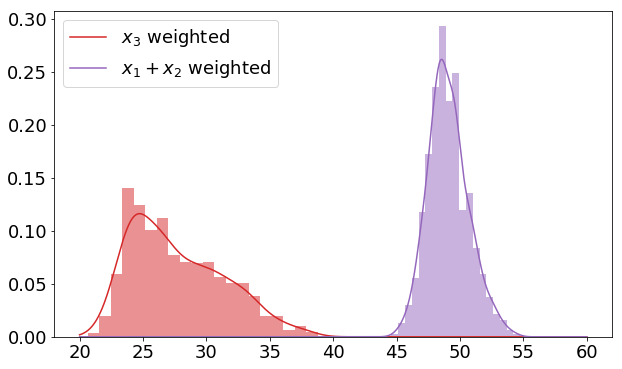

In [46]:
fig, ax = plt.subplots(figsize=(10,6))
#ax = plot_hist(ax,interior_points_sum[:,0],color='C1')
#ax = plot_hist(ax,interior_points_sum[:,1],color='C2')
ax = plot_hist(ax,interior_points_sum[:,0],color='C3',w=interior_weights)
ax = plot_hist(ax,interior_points_sum[:,1],color='C4',w=interior_weights)
ax.legend(['$x_3$ weighted','$x_1+x_2$ weighted']);
#fig.xlabel('MW installed capacity')

### True Solution

In [23]:
logging.disable()
data_detail_full = []
dim=10
old_volume = 0
epsilon = 1
while epsilon > 0.005:
    if len(data_detail_full)<=1 : # if only original solution exists, max/min directions are chosen
        directions = np.concatenate([np.diag(np.ones(6)),-np.diag(np.ones(6))],axis=0)
        directions = np.append(directions,[[1,0,1,0,1,0],[-1,0,-1,0,-1,0],[0,1,0,1,0,1],[0,-1,0,-1,0,-1]],axis=0)
    else : # Otherwise search in directions normal to faces
        directions = np.array(hull.equations)[:,0:-1]
    # Itterate over directions in batch 
    if len(directions)>100:
        directions = directions[0:100]
    for direction in directions:
        print(direction)
        #direction = np.concatenate([direction,[0]])
        network = network.copy()
        options = dict(dim=5,old_objective_value=old_objective_value)
        network.lopf(network.snapshots,                                 
                        solver_name='gurobi',                                 
                        extra_functionality=lambda network,                                 
                        snapshots: direction_search(network,snapshots,options,direction))

        data_detail_full.append(network.generators.p_nom_opt)
    

    hull = ConvexHull(data_detail_full,qhull_options='Qx')
    
    delta_v = hull.volume - old_volume
    old_volume = hull.volume
    epsilon = delta_v/hull.volume
    
    print('############ epsilon ###########')
    print(epsilon)


data_detail_full = np.array(data_detail_full)

[1. 0. 0. 0. 0. 0.]
generator_p_nom[DK offwind]
[0. 1. 0. 0. 0. 0.]
generator_p_nom[DK ocgt]
[0. 0. 1. 0. 0. 0.]
generator_p_nom[NO onwind]
[0. 0. 0. 1. 0. 0.]
generator_p_nom[NO ocgt]
[0. 0. 0. 0. 1. 0.]
generator_p_nom[SE onwind]
[0. 0. 0. 0. 0. 1.]
generator_p_nom[SE ocgt]
[-1. -0. -0. -0. -0. -0.]
- generator_p_nom[DK offwind]
[-0. -1. -0. -0. -0. -0.]
- generator_p_nom[DK ocgt]
[-0. -0. -1. -0. -0. -0.]
- generator_p_nom[NO onwind]
[-0. -0. -0. -1. -0. -0.]
- generator_p_nom[NO ocgt]
[-0. -0. -0. -0. -1. -0.]
- generator_p_nom[SE onwind]
[-0. -0. -0. -0. -0. -1.]
- generator_p_nom[SE ocgt]
[1. 0. 1. 0. 1. 0.]
generator_p_nom[DK offwind] + generator_p_nom[NO onwind] + generator_p_nom[SE onwind]
[-1.  0. -1.  0. -1.  0.]
- generator_p_nom[DK offwind] - generator_p_nom[NO onwind] - generator_p_nom[SE onwind]
[0. 1. 0. 1. 0. 1.]
generator_p_nom[DK ocgt] + generator_p_nom[NO ocgt] + generator_p_nom[SE ocgt]
[ 0. -1.  0. -1.  0. -1.]
- generator_p_nom[DK ocgt] - generator_p_nom[NO ocgt]

[0.78421703 0.15486371 0.41768645 0.22065995 0.35276407 0.11586894]
0.7842170253273906*generator_p_nom[DK offwind] + 0.1548637126245772*generator_p_nom[DK ocgt] + 0.41768645392707193*generator_p_nom[NO onwind] + 0.22065994724615076*generator_p_nom[NO ocgt] + 0.35276407192583387*generator_p_nom[SE onwind] + 0.11586893951465324*generator_p_nom[SE ocgt]
[ 0.838709   -0.03051236  0.37691042  0.13577515  0.35792743  0.08383198]
0.8387090039128676*generator_p_nom[DK offwind] - 0.030512355233940334*generator_p_nom[DK ocgt] + 0.37691041942056935*generator_p_nom[NO onwind] + 0.13577515071551877*generator_p_nom[NO ocgt] + 0.357927432049298*generator_p_nom[SE onwind] + 0.08383197779217127*generator_p_nom[SE ocgt]
[0.82497045 0.0095485  0.38208872 0.16007311 0.36345219 0.12497959]
0.8249704485617632*generator_p_nom[DK offwind] + 0.00954849981871221*generator_p_nom[DK ocgt] + 0.38208872437668095*generator_p_nom[NO onwind] + 0.16007311223029086*generator_p_nom[NO ocgt] + 0.3634521879734447*generator

[ 0.85986964  0.08627364  0.34458066 -0.14761219  0.31864305 -0.10546317]
0.8598696372224653*generator_p_nom[DK offwind] + 0.08627364116699482*generator_p_nom[DK ocgt] + 0.34458066482795785*generator_p_nom[NO onwind] - 0.14761218805909204*generator_p_nom[NO ocgt] + 0.3186430488392695*generator_p_nom[SE onwind] - 0.10546317182902906*generator_p_nom[SE ocgt]
[ 0.87925434  0.13697509  0.31533513 -0.06956573  0.29542165 -0.12884114]
0.8792543434393151*generator_p_nom[DK offwind] + 0.1369750915262669*generator_p_nom[DK ocgt] + 0.31533512727220214*generator_p_nom[NO onwind] - 0.0695657333963609*generator_p_nom[NO ocgt] + 0.2954216481320674*generator_p_nom[SE onwind] - 0.12884114212724693*generator_p_nom[SE ocgt]
[ 0.73107823  0.12388739  0.25678259 -0.19732005  0.10061019 -0.57894872]
0.7310782348874216*generator_p_nom[DK offwind] + 0.12388738814184012*generator_p_nom[DK ocgt] + 0.2567825938013534*generator_p_nom[NO onwind] - 0.1973200493813526*generator_p_nom[NO ocgt] + 0.10061018509227439*

[ 0.80206986 -0.10804211  0.38977946  0.12695118  0.39719471  0.13857337]
0.8020698570696608*generator_p_nom[DK offwind] - 0.10804211344890792*generator_p_nom[DK ocgt] + 0.3897794580084223*generator_p_nom[NO onwind] + 0.12695118497418068*generator_p_nom[NO ocgt] + 0.39719470991582156*generator_p_nom[SE onwind] + 0.13857337141364987*generator_p_nom[SE ocgt]
[ 0.81903332 -0.08613644  0.38104676  0.13069346  0.37763428  0.12992253]
0.8190333234910321*generator_p_nom[DK offwind] - 0.08613643896202887*generator_p_nom[DK ocgt] + 0.3810467608660627*generator_p_nom[NO onwind] + 0.13069345838385008*generator_p_nom[NO ocgt] + 0.3776342820396814*generator_p_nom[SE onwind] + 0.12992253034674156*generator_p_nom[SE ocgt]
[ 0.82457192 -0.04528375  0.37552894  0.13999637  0.37451533  0.13094972]
0.824571919077916*generator_p_nom[DK offwind] - 0.045283749198664396*generator_p_nom[DK ocgt] + 0.375528943423476*generator_p_nom[NO onwind] + 0.13999637046282554*generator_p_nom[NO ocgt] + 0.37451532928251213

[0.77721917 0.16795846 0.33087361 0.22625113 0.40483756 0.20774972]
0.7772191735268281*generator_p_nom[DK offwind] + 0.1679584575910939*generator_p_nom[DK ocgt] + 0.3308736081710804*generator_p_nom[NO onwind] + 0.2262511335768595*generator_p_nom[NO ocgt] + 0.40483755617413303*generator_p_nom[SE onwind] + 0.20774971939304024*generator_p_nom[SE ocgt]
[-0.51403868  0.49072519 -0.45873754  0.35960681 -0.22817222  0.32114371]
-0.5140386761872242*generator_p_nom[DK offwind] + 0.49072518973565643*generator_p_nom[DK ocgt] - 0.4587375434874952*generator_p_nom[NO onwind] + 0.35960680508653375*generator_p_nom[NO ocgt] - 0.22817221583160613*generator_p_nom[SE onwind] + 0.3211437052093644*generator_p_nom[SE ocgt]
[-0.75851991  0.190534   -0.49448423  0.12049669 -0.35773475  0.03655254]
-0.7585199080753297*generator_p_nom[DK offwind] + 0.19053400463981965*generator_p_nom[DK ocgt] - 0.4944842285334163*generator_p_nom[NO onwind] + 0.12049669177399701*generator_p_nom[NO ocgt] - 0.357734746805766*genera

[0.91787237 0.28634291 0.11754236 0.06951947 0.21573241 0.10162879]
0.9178723721495279*generator_p_nom[DK offwind] + 0.28634291216216823*generator_p_nom[DK ocgt] + 0.11754235915901054*generator_p_nom[NO onwind] + 0.06951947039286412*generator_p_nom[NO ocgt] + 0.21573240848364858*generator_p_nom[SE onwind] + 0.10162878562967112*generator_p_nom[SE ocgt]
[ 0.78612662  0.12174954  0.34315787  0.0697911   0.26616024 -0.41678843]
0.7861266172018501*generator_p_nom[DK offwind] + 0.12174953954910464*generator_p_nom[DK ocgt] + 0.34315787151444566*generator_p_nom[NO onwind] + 0.06979110170718499*generator_p_nom[NO ocgt] + 0.2661602354005859*generator_p_nom[SE onwind] - 0.41678843287456313*generator_p_nom[SE ocgt]
[-0.41002692  0.43218212 -0.60751002  0.27064599 -0.33892574  0.2964932 ]
-0.4100269151282603*generator_p_nom[DK offwind] + 0.43218211668834544*generator_p_nom[DK ocgt] - 0.6075100176848031*generator_p_nom[NO onwind] + 0.27064599327457645*generator_p_nom[NO ocgt] - 0.3389257385200284*ge

[ 0.85726902  0.11185685  0.35672801  0.09458159  0.27433932 -0.20276898]
0.8572690194408844*generator_p_nom[DK offwind] + 0.11185684541630805*generator_p_nom[DK ocgt] + 0.35672801181196695*generator_p_nom[NO onwind] + 0.0945815940296284*generator_p_nom[NO ocgt] + 0.27433932152479645*generator_p_nom[SE onwind] - 0.20276897880392566*generator_p_nom[SE ocgt]
[ 0.86254705  0.11547555  0.35070255  0.09957377  0.26571813 -0.19790059]
0.8625470504515644*generator_p_nom[DK offwind] + 0.11547555103909984*generator_p_nom[DK ocgt] + 0.3507025500265133*generator_p_nom[NO onwind] + 0.09957376843449196*generator_p_nom[NO ocgt] + 0.2657181330029573*generator_p_nom[SE onwind] - 0.19790058794152246*generator_p_nom[SE ocgt]
[ 0.85943746  0.16294194  0.34559862  0.10467809  0.290487   -0.14155766]
0.8594374580756062*generator_p_nom[DK offwind] + 0.16294194401252124*generator_p_nom[DK ocgt] + 0.3455986171724856*generator_p_nom[NO onwind] + 0.10467809413788001*generator_p_nom[NO ocgt] + 0.2904870047932840

[ 0.76923121 -0.36999192  0.38398459  0.06696779  0.34526753 -0.01583721]
0.76923120583922*generator_p_nom[DK offwind] - 0.3699919154538334*generator_p_nom[DK ocgt] + 0.3839845850715945*generator_p_nom[NO onwind] + 0.06696779468658207*generator_p_nom[NO ocgt] + 0.34526753436968116*generator_p_nom[SE onwind] - 0.015837205385901283*generator_p_nom[SE ocgt]
[ 0.75432372 -0.3048794   0.41385352  0.06561649  0.40222548  0.02605146]
0.754323719844134*generator_p_nom[DK offwind] - 0.30487940353569365*generator_p_nom[DK ocgt] + 0.4138535175547533*generator_p_nom[NO onwind] + 0.06561649457437843*generator_p_nom[NO ocgt] + 0.4022254819183923*generator_p_nom[SE onwind] + 0.026051455296646615*generator_p_nom[SE ocgt]
[ 0.85344521 -0.25215487  0.10894942  0.26541554  0.17709662  0.30719799]
0.8534452058731443*generator_p_nom[DK offwind] - 0.25215486506417534*generator_p_nom[DK ocgt] + 0.10894942282240515*generator_p_nom[NO onwind] + 0.26541553939901397*generator_p_nom[NO ocgt] + 0.1770966239001349*

[-0.13230771 -0.6205917  -0.15305482 -0.53147776 -0.15226743 -0.51795835]
-0.13230770605735742*generator_p_nom[DK offwind] - 0.6205916973421903*generator_p_nom[DK ocgt] - 0.15305482451350216*generator_p_nom[NO onwind] - 0.5314777613647723*generator_p_nom[NO ocgt] - 0.15226743118237274*generator_p_nom[SE onwind] - 0.5179583529365385*generator_p_nom[SE ocgt]
[ 0.77153857 -0.06986106  0.36546792  0.15101174  0.44821677  0.2063445 ]
0.7715385670593631*generator_p_nom[DK offwind] - 0.06986106354777483*generator_p_nom[DK ocgt] + 0.3654679167328385*generator_p_nom[NO onwind] + 0.15101173685278785*generator_p_nom[NO ocgt] + 0.4482167742199865*generator_p_nom[SE onwind] + 0.2063444979141712*generator_p_nom[SE ocgt]
[ 0.77423201 -0.23448069  0.3595887   0.07351344  0.43347046  0.15158727]
0.7742320095898862*generator_p_nom[DK offwind] - 0.23448068964999888*generator_p_nom[DK ocgt] + 0.35958870053163017*generator_p_nom[NO onwind] + 0.07351344411187873*generator_p_nom[NO ocgt] + 0.4334704617272567

[ 0.75987919  0.0136046   0.13518953 -0.61823709  0.1453732   0.02778227]
0.7598791941391381*generator_p_nom[DK offwind] + 0.013604602001428547*generator_p_nom[DK ocgt] + 0.1351895337251222*generator_p_nom[NO onwind] - 0.6182370853443006*generator_p_nom[NO ocgt] + 0.14537319942902088*generator_p_nom[SE onwind] + 0.027782265616310038*generator_p_nom[SE ocgt]
[ 0.75475948  0.02216261  0.1298066  -0.6269907   0.13873314  0.02515894]
0.7547594792081558*generator_p_nom[DK offwind] + 0.022162612524112852*generator_p_nom[DK ocgt] + 0.12980660092213778*generator_p_nom[NO onwind] - 0.626990700100648*generator_p_nom[NO ocgt] + 0.1387331368104704*generator_p_nom[SE onwind] + 0.02515893969560512*generator_p_nom[SE ocgt]
[ 0.84096444  0.06360459  0.21077825 -0.44865553  0.19722525  0.06415767]
0.8409644415202325*generator_p_nom[DK offwind] + 0.06360459086181584*generator_p_nom[DK ocgt] + 0.21077824576287182*generator_p_nom[NO onwind] - 0.4486555336427389*generator_p_nom[NO ocgt] + 0.197225252739365

[0.77457354 0.01468113 0.35947346 0.10759081 0.46366373 0.20985541]
0.7745735378699822*generator_p_nom[DK offwind] + 0.014681134889019183*generator_p_nom[DK ocgt] + 0.35947345605522796*generator_p_nom[NO onwind] + 0.10759080637289252*generator_p_nom[NO ocgt] + 0.463663733944855*generator_p_nom[SE onwind] + 0.20985541048542308*generator_p_nom[SE ocgt]
[-0.27981984 -0.5332406  -0.21145789 -0.52962804 -0.18936403 -0.52561991]
-0.2798198352702179*generator_p_nom[DK offwind] - 0.5332405972475186*generator_p_nom[DK ocgt] - 0.21145789109316213*generator_p_nom[NO onwind] - 0.5296280390330477*generator_p_nom[NO ocgt] - 0.18936402623971565*generator_p_nom[SE onwind] - 0.5256199115018217*generator_p_nom[SE ocgt]
[-0.27464052 -0.53518357 -0.2099504  -0.53103203 -0.18695647 -0.52642589]
-0.27464052337512784*generator_p_nom[DK offwind] - 0.5351835745462044*generator_p_nom[DK ocgt] - 0.20995040161403591*generator_p_nom[NO onwind] - 0.5310320270181983*generator_p_nom[NO ocgt] - 0.18695646588563494*gen

[-0.74141121 -0.00173298 -0.48650406  0.00543277 -0.46207542  0.00877487]
-0.7414112123103319*generator_p_nom[DK offwind] - 0.0017329827277406556*generator_p_nom[DK ocgt] - 0.4865040613805939*generator_p_nom[NO onwind] + 0.005432772985846191*generator_p_nom[NO ocgt] - 0.4620754222638717*generator_p_nom[SE onwind] + 0.008774873727029961*generator_p_nom[SE ocgt]
[0.76192661 0.05637434 0.35418951 0.17351579 0.45798067 0.22579976]
0.7619266118011354*generator_p_nom[DK offwind] + 0.05637434333518442*generator_p_nom[DK ocgt] + 0.3541895146790122*generator_p_nom[NO onwind] + 0.17351579355263688*generator_p_nom[NO ocgt] + 0.45798067380203744*generator_p_nom[SE onwind] + 0.22579975895878393*generator_p_nom[SE ocgt]
[0.76524274 0.01066641 0.3634809  0.17037115 0.45434253 0.21614336]
0.765242742259442*generator_p_nom[DK offwind] + 0.010666407816375123*generator_p_nom[DK ocgt] + 0.363480895896704*generator_p_nom[NO onwind] + 0.17037115406844044*generator_p_nom[NO ocgt] + 0.4543425262774461*generat

[0.83515061 0.13170524 0.40282485 0.14884464 0.31597607 0.03022794]
0.8351506099969973*generator_p_nom[DK offwind] + 0.13170523932518274*generator_p_nom[DK ocgt] + 0.40282484849624134*generator_p_nom[NO onwind] + 0.14884464211776244*generator_p_nom[NO ocgt] + 0.3159760654749948*generator_p_nom[SE onwind] + 0.0302279431932925*generator_p_nom[SE ocgt]
[ 0.7520895   0.42566709  0.22442491  0.2412739  -0.17471013  0.33773607]
0.7520895008239913*generator_p_nom[DK offwind] + 0.4256670870467315*generator_p_nom[DK ocgt] + 0.22442490842801968*generator_p_nom[NO onwind] + 0.24127390035508395*generator_p_nom[NO ocgt] - 0.17471012754140194*generator_p_nom[SE onwind] + 0.3377360664401373*generator_p_nom[SE ocgt]
[0.84549646 0.35693807 0.26612824 0.2791536  0.02872495 0.0903042 ]
0.8454964640258018*generator_p_nom[DK offwind] + 0.35693807037108344*generator_p_nom[DK ocgt] + 0.2661282380600382*generator_p_nom[NO onwind] + 0.2791535997193664*generator_p_nom[NO ocgt] + 0.02872494560243292*generator_p_

[ 0.70865429 -0.3611748   0.40634841  0.01532795  0.44414583  0.06886483]
0.7086542895937533*generator_p_nom[DK offwind] - 0.36117480496278465*generator_p_nom[DK ocgt] + 0.4063484096014935*generator_p_nom[NO onwind] + 0.015327953207041233*generator_p_nom[NO ocgt] + 0.4441458289071383*generator_p_nom[SE onwind] + 0.06886482868400993*generator_p_nom[SE ocgt]
[ 0.57609216 -0.60744075  0.31885831 -0.21270659  0.35739324 -0.15648937]
0.5760921583753439*generator_p_nom[DK offwind] - 0.6074407465322211*generator_p_nom[DK ocgt] + 0.31885831252070357*generator_p_nom[NO onwind] - 0.2127065895763473*generator_p_nom[NO ocgt] + 0.3573932373701065*generator_p_nom[SE onwind] - 0.15648936602906605*generator_p_nom[SE ocgt]
[ 0.70439131 -0.37674914  0.4028704   0.01228322  0.4414259   0.06768087]
0.7043913088435815*generator_p_nom[DK offwind] - 0.37674914302046264*generator_p_nom[DK ocgt] + 0.4028704019271115*generator_p_nom[NO onwind] + 0.012283217951034719*generator_p_nom[NO ocgt] + 0.4414259035431688

[-0.31375699 -0.52226596 -0.21952301 -0.51893273 -0.20499296 -0.51893273]
-0.31375699102938914*generator_p_nom[DK offwind] - 0.5222659567776144*generator_p_nom[DK ocgt] - 0.2195230090012684*generator_p_nom[NO onwind] - 0.5189327296832614*generator_p_nom[NO ocgt] - 0.20499295992145472*generator_p_nom[SE onwind] - 0.518932729683237*generator_p_nom[SE ocgt]
[-0.29398056 -0.52344026 -0.21806263 -0.5260118  -0.19947672 -0.52493337]
-0.29398055980381815*generator_p_nom[DK offwind] - 0.5234402572944068*generator_p_nom[DK ocgt] - 0.21806262978141996*generator_p_nom[NO onwind] - 0.5260118028649049*generator_p_nom[NO ocgt] - 0.19947672121044863*generator_p_nom[SE onwind] - 0.5249333652338664*generator_p_nom[SE ocgt]
[ 0.82498022  0.00953746  0.41987432  0.14566548  0.34894138 -0.0066113 ]
0.8249802219894611*generator_p_nom[DK offwind] + 0.009537462542826424*generator_p_nom[DK ocgt] + 0.4198743187667809*generator_p_nom[NO onwind] + 0.14566547857882858*generator_p_nom[NO ocgt] + 0.3489413784507077

[ 0.76831522 -0.0008934   0.14441821 -0.6026719   0.15677137  0.03230514]
0.7683152172799578*generator_p_nom[DK offwind] - 0.0008934024752475494*generator_p_nom[DK ocgt] + 0.1444182111513984*generator_p_nom[NO onwind] - 0.6026719035392784*generator_p_nom[NO ocgt] + 0.15677137451943285*generator_p_nom[SE onwind] + 0.03230513630259125*generator_p_nom[SE ocgt]
[-0.34521304 -0.51762159 -0.22363369 -0.5060115  -0.22448621 -0.50640114]
-0.3452130445096586*generator_p_nom[DK offwind] - 0.5176215902332637*generator_p_nom[DK ocgt] - 0.22363369299057637*generator_p_nom[NO onwind] - 0.5060114992559948*generator_p_nom[NO ocgt] - 0.22448621173052577*generator_p_nom[SE onwind] - 0.5064011433120331*generator_p_nom[SE ocgt]
[-0.34342127 -0.51892057 -0.22286218 -0.506567   -0.22337291 -0.506567  ]
-0.34342127263590483*generator_p_nom[DK offwind] - 0.5189205738054364*generator_p_nom[DK ocgt] - 0.22286217887157372*generator_p_nom[NO onwind] - 0.5065670038575077*generator_p_nom[NO ocgt] - 0.22337291245105

[ 0.82474401  0.00788734  0.41998459  0.14569752  0.34940953 -0.00576822]
0.8247440068111201*generator_p_nom[DK offwind] + 0.007887342585257624*generator_p_nom[DK ocgt] + 0.4199845923535212*generator_p_nom[NO onwind] + 0.1456975171751396*generator_p_nom[NO ocgt] + 0.34940952537083053*generator_p_nom[SE onwind] - 0.005768215569771507*generator_p_nom[SE ocgt]
[ 0.81941736 -0.03963439  0.40119032  0.14538247  0.36369101  0.11235398]
0.819417359394138*generator_p_nom[DK offwind] - 0.039634393068973414*generator_p_nom[DK ocgt] + 0.40119032072364114*generator_p_nom[NO onwind] + 0.1453824737186155*generator_p_nom[NO ocgt] + 0.3636910132811584*generator_p_nom[SE onwind] + 0.1123539752800714*generator_p_nom[SE ocgt]
[ 0.61674786 -0.68870181  0.28264231  0.06435074  0.24754388 -0.00249546]
0.6167478624902534*generator_p_nom[DK offwind] - 0.6887018080814492*generator_p_nom[DK ocgt] + 0.28264230897095904*generator_p_nom[NO onwind] + 0.06435074306928251*generator_p_nom[NO ocgt] + 0.2475438816873630

[-0.4485099   0.22770308 -0.66056646  0.03046427 -0.50780445  0.22770308]
-0.4485099000980149*generator_p_nom[DK offwind] + 0.22770307842825332*generator_p_nom[DK ocgt] - 0.6605664626209381*generator_p_nom[NO onwind] + 0.030464274809839216*generator_p_nom[NO ocgt] - 0.5078044526030012*generator_p_nom[SE onwind] + 0.22770307842825302*generator_p_nom[SE ocgt]
[0.79245251 0.20231386 0.31503587 0.13142392 0.41669819 0.20231386]
0.7924525065487317*generator_p_nom[DK offwind] + 0.2023138609665847*generator_p_nom[DK ocgt] + 0.3150358674122328*generator_p_nom[NO onwind] + 0.1314239166204809*generator_p_nom[NO ocgt] + 0.4166981936248037*generator_p_nom[SE onwind] + 0.20231386096658427*generator_p_nom[SE ocgt]
[-0.29960862 -0.52009063 -0.22059258 -0.52401551 -0.20652518 -0.52329191]
-0.2996086175109865*generator_p_nom[DK offwind] - 0.5200906266301247*generator_p_nom[DK ocgt] - 0.2205925823031713*generator_p_nom[NO onwind] - 0.5240155137732162*generator_p_nom[NO ocgt] - 0.20652518246303134*genera

In [50]:
hull_full = ConvexHull(data_detail_full)
interior_points_full = create_interior_points(hull_full,2000)

In [25]:
fig = go.Figure()



fig.add_trace(go.Scatter(x=hull_sum.points[np.append(hull_sum.vertices,hull_sum.vertices[0])][:,1],
                          y=hull_sum.points[np.append(hull_sum.vertices,hull_sum.vertices[0])][:,0],
                          #z=data_detail_sum[:,2],
                          mode='lines'))

fig.add_trace(go.Scatter(x=data_detail_full[:,0]+data_detail_full[:,2]+data_detail_full[:,4],
                          y=data_detail_full[:,1]+data_detail_full[:,3]+data_detail_full[:,5],
                          #z=data_detail_sum[:,2],
                          mode='markers',name='MGA solutions'))



fig.add_trace(go.Scatter(x=interior_points_full[:,0]+interior_points_full[:,2]+interior_points_full[:,4],
                          y=interior_points_full[:,1]+interior_points_full[:,3]+interior_points_full[:,5],
                          #z=[np.mean(data_detail_sum,axis=0)[2]],
                          mode='markers',marker=dict(opacity=0.2), name='Interrior_points'))
fig.update_yaxes(title_text='$x_3$')
fig.update_xaxes(title_text='$x_1+x_2$')

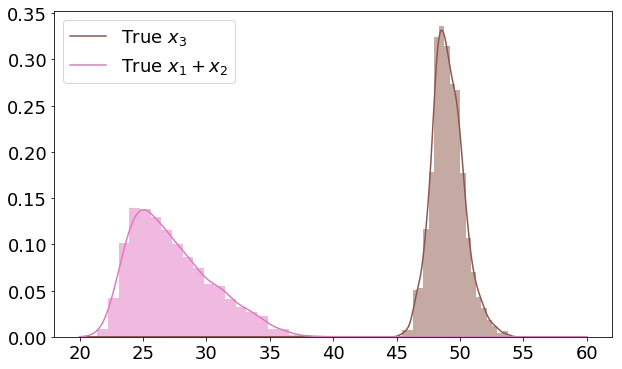

In [51]:
fig, ax = plt.subplots(figsize=(10,6))
ax = plot_hist(ax,interior_points_full[:,0]+interior_points_full[:,2]+interior_points_full[:,4],color='C5')
ax = plot_hist(ax,interior_points_full[:,1]+interior_points_full[:,3]+interior_points_full[:,5],color='C6')
ax.legend(['True $x_3$','True $x_1+x_2$']);

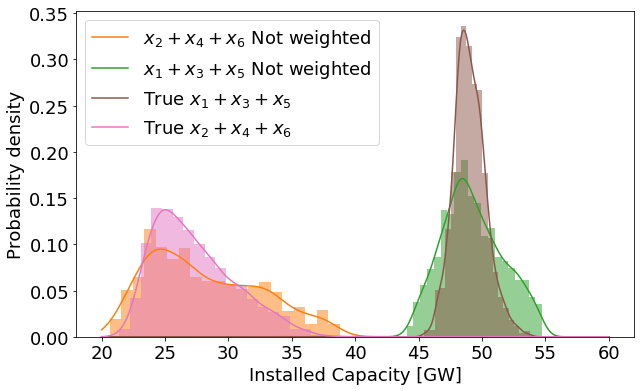

In [56]:
fig, ax = plt.subplots(figsize=(10,6))
ax = plot_hist(ax,interior_points_sum[:,0],color='C1')
ax = plot_hist(ax,interior_points_sum[:,1],color='C2')
ax = plot_hist(ax,interior_points_full[:,0]+interior_points_full[:,2]+interior_points_full[:,4],color='C5')
ax = plot_hist(ax,interior_points_full[:,1]+interior_points_full[:,3]+interior_points_full[:,5],color='C6')
ax.legend(['$x_2+x_4+x_6$ Not weighted','$x_1+x_3+x_5$ Not weighted','True $x_1+x_3+x_5$','True $x_2+x_4+x_6$']);
ax.set_xlabel('Installed Capacity [GW]')
ax.set_ylabel('Probability density')
fig.savefig("C:/Users\Tim\OneDrive - Aarhus universitet\Speciale\Report\Images\multi_6D_1.pdf", bbox_inches='tight')

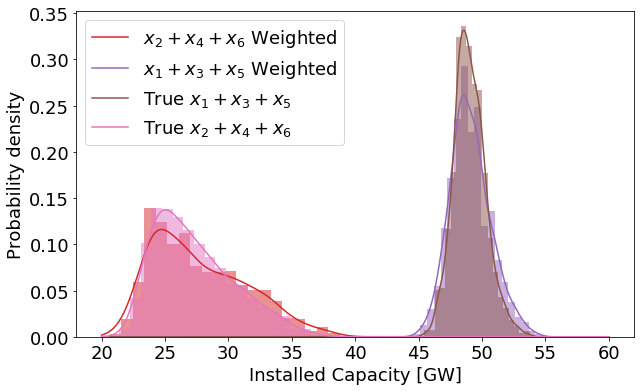

In [58]:
fig, ax = plt.subplots(figsize=(10,6))
#ax = plot_hist(ax,interior_points_sum[:,0],color='C1')
#ax = plot_hist(ax,interior_points_sum[:,1],color='C2')
ax = plot_hist(ax,interior_points_sum[:,0],color='C3',w=interior_weights)
ax = plot_hist(ax,interior_points_sum[:,1],color='C4',w=interior_weights)
ax = plot_hist(ax,interior_points_full[:,0]+interior_points_full[:,2]+interior_points_full[:,4],color='C5')
ax = plot_hist(ax,interior_points_full[:,1]+interior_points_full[:,3]+interior_points_full[:,5],color='C6')
ax.legend(['$x_2+x_4+x_6$ Weighted','$x_1+x_3+x_5$ Weighted','True $x_1+x_3+x_5$','True $x_2+x_4+x_6$']);
ax.set_xlabel('Installed Capacity [GW]')
ax.set_ylabel('Probability density')
fig.savefig("C:/Users\Tim\OneDrive - Aarhus universitet\Speciale\Report\Images\multi_6D_2.pdf", bbox_inches='tight')

### Visualization of problem

In [29]:
n = 3
a1 = sample_points[n,0]
a2 = sample_points[n,1]
print(a1,a2)
s,t = np.meshgrid([1000,20000],[1001,20000])
s = np.reshape(s,[4])
t = np.reshape(t,[4])


20502.808651011423 55228.11219566745


In [30]:
P1 = np.array([0,0.,a1])
A1 = np.array([1,0.,0])
B1 = np.array([0,1,0])

P2 = np.array([a2,0.,0])
A2 = np.array([0,-0.001,1])
B2 = np.array([-1,1,0])

In [31]:
p1 = []
p2 = []
l1 = []
for i in range(len(s)):
    p1.append( P1 +s[i]*A1 + t[i]*B1 )
    p2.append( P2 +s[i]*A2 + t[i]*B2 )
    l1.append( P1 + A1*(P2-P1)/(A1-A2) + t[i]*(A1*(B2-B1)/(A1-A2)+B1) )
p1 = np.array(p1)
p2 = np.array(p2)
l1 = np.array(l1)

In [32]:
fig = go.Figure()

fig.add_trace(go.Scatter3d(x=data_detail_full[:,0],
                          y=data_detail_full[:,1],
                          z=data_detail_full[:,2],
                          mode='markers'))

fig.add_trace(go.Mesh3d(x=p1[:,0],y=p1[:,1],z=p1[:,2],opacity=0.5,color='yellow'))
fig.add_trace(go.Mesh3d(x=p2[:,0],y=p2[:,1],z=p2[:,2],opacity=0.5,delaunayaxis='x',color='yellow'))
fig.add_trace(go.Scatter3d(x=l1[:,0],y=l1[:,1],z=l1[:,2],opacity=1,mode='lines',line=dict(color='red',width=10)))


points = hull_full.points
for s in hull_full.simplices:
    s = np.append(s, s[0])  # Here we cycle back to the first coordinate
    fig.add_trace(go.Mesh3d(x=points[s, 0], 
                                y=points[s, 1], 
                                z=points[s, 2],
                                opacity=0.5,
                                color='pink'
                                ))
fig.update_layout(scene = dict(
                     xaxis = dict(nticks=4, range=[0,6000],),
                     yaxis = dict(nticks=4, range=[5000,22500],),
                     zaxis = dict(nticks=4, range=[8500,18000],),),
                 )

fig.show()

In [33]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=data_detail_full[:,0],
                          y=data_detail_full[:,1],
                          #z=data_detail_full[:,2],
                          mode='markers'))



fig.add_trace(go.Scatter(x=l1[:,0],
                         y=l1[:,1],
                         #z=l1[:,2],
                         opacity=1,mode='lines',line=dict(color='red',width=5)))

fig.update_yaxes(title_text='$x_2$',range=[10000,23000])
fig.update_xaxes(title_text='$x_1$',range=[-100,6000])
fig.show()

In [34]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=data_detail_full[:,0],
                          y=data_detail_full[:,2],
                          #z=data_detail_full[:,2],
                          mode='markers'))



fig.add_trace(go.Scatter(x=l1[:,0],
                         y=l1[:,2],
                         #z=l1[:,2],
                         opacity=1,mode='lines',line=dict(color='red',width=5)))

fig.update_yaxes(title_text='$x_3$',range=[7000,20000])
fig.update_xaxes(title_text='$x_1$',range=[-100,6000])
fig.show()